In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# sns.set()
# import scipy.stats as stats

In [2]:
df_customer = pd.read_csv('customer.csv')
df_click = pd.read_csv('click_stream.csv')
df_product = pd.read_csv('product.csv', on_bad_lines='skip')
df_trans = pd.read_csv('transactions.csv')

In [3]:
## Use this instead, if you're using colab

# url1='https://drive.google.com/file/d/17B6EQ9TJosC3b_u7ykg5ZpxPIFs2k3EO/view?usp=sharing'
# url1='https://drive.google.com/uc?id=' + url1.split('/')[-2]
# df_click = pd.read_csv(url1)

# url2='https://drive.google.com/file/d/1jyytgw3oU2IJPf0AVA6JbW0DZ2dKv2Ge/view?usp=sharing'
# url2='https://drive.google.com/uc?id=' + url2.split('/')[-2]
# df_customer = pd.read_csv(url2)

# url3='https://drive.google.com/file/d/1rnTQrQl7IMCGJETDxMhYrAtj1gL3h_Ih/view?usp=sharing'
# url3='https://drive.google.com/uc?id=' + url3.split('/')[-2]
# df_product = pd.read_csv(url3, on_bad_lines='skip')

# url4='https://drive.google.com/file/d/1McJFpLLgyeQ--DcH-N8yF656ltSeoMiz/view?usp=sharing'
# url4='https://drive.google.com/uc?id=' + url4.split('/')[-2]
# df_trans = pd.read_csv(url4)



# Inspeksi dan Cleaning Data

## Dataset Customer

In [4]:
# inspeksi dan cleaning data
df_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   customer_id         100000 non-null  int64  
 1   first_name          100000 non-null  object 
 2   last_name           100000 non-null  object 
 3   username            100000 non-null  object 
 4   email               100000 non-null  object 
 5   gender              100000 non-null  object 
 6   birthdate           100000 non-null  object 
 7   device_type         100000 non-null  object 
 8   device_id           100000 non-null  object 
 9   device_version      100000 non-null  object 
 10  home_location_lat   100000 non-null  float64
 11  home_location_long  100000 non-null  float64
 12  home_location       100000 non-null  object 
 13  home_country        100000 non-null  object 
 14  first_join_date     100000 non-null  object 
dtypes: float64(2), int64(1), object(12)

In [5]:
df_customer.shape

(100000, 15)

In [6]:
df_customer.head()

,customer_id,first_name,last_name,username,email,gender,birthdate,device_type,device_id,device_version,home_location_lat,home_location_long,home_location,home_country,first_join_date
0,2870,Lala,Maryati,671a0865-ac4e-4dc4-9c4f-c286a1176f7e,671a0865_ac4e_4dc4_9c4f_c286a1176f7e@startupca...,F,1996-06-14,iOS,c9c0de76-0a6c-4ac2-843f-65264ab9fe63,iPhone; CPU iPhone OS 14_2_1 like Mac OS X,-1.043345,101.360523,Sumatera Barat,Indonesia,2019-07-21
1,8193,Maimunah,Laksmiwati,83be2ba7-8133-48a4-bbcb-b46a2762473f,83be2ba7_8133_48a4_bbcb_b46a2762473f@zakyfound...,F,1993-08-16,Android,fb331c3d-f42e-40fe-afe2-b4b73a8a6e25,Android 2.2.1,-6.212489,106.818850,Jakarta Raya,Indonesia,2017-07-16
2,7279,Bakiman,Simanjuntak,3250e5a3-1d23-4675-a647-3281879d42be,3250e5a3_1d23_4675_a647_3281879d42be@startupca...,M,1989-01-23,iOS,d13dde0a-6ae1-43c3-83a7-11bbb922730b,iPad; CPU iPad OS 4_2_1 like Mac OS X,-8.631607,116.428436,Nusa Tenggara Barat,Indonesia,2020-08-23
3,88813,Cahyadi,Maheswara,df797edf-b465-4a80-973b-9fbb612260c2,df797edf_b465_4a80_973b_9fbb612260c2@zakyfound...,M,1991-01-05,iOS,f4c18515-c5be-419f-8142-f037be47c9cd,iPad; CPU iPad OS 14_2 like Mac OS X,1.299332,115.774934,Kalimantan Timur,Indonesia,2021-10-03
4,82542,Irnanto,Wijaya,36ab08e1-03de-42a8-9e3b-59528c798824,36ab08e1_03de_42a8_9e3b_59528c798824@startupca...,M,2000-07-15,iOS,e46e4c36-4630-4736-8fcf-663db29ca3b0,iPhone; CPU iPhone OS 10_3_3 like Mac OS X,-2.980807,114.924675,Kalimantan Selatan,Indonesia,2021-04-11


In [7]:
df_customer.sample(10)

,customer_id,first_name,last_name,username,email,gender,birthdate,device_type,device_id,device_version,home_location_lat,home_location_long,home_location,home_country,first_join_date
98791,73213,Elvina,Usada,442aa3df-74e0-481b-9b55-43aa9e56a228,442aa3df_74e0_481b_9b55_43aa9e56a228@startupca...,F,1998-10-08,Android,227ad88d-7805-4c45-9508-ddbed41e01b0,Android 6.0.1,0.877746,103.739460,Kepulauan Riau,Indonesia,2021-06-18
52276,21061,Kiandra,Hassanah,eb320592-5d6a-4ed8-9df0-2ead4cc47cf7,eb320592_5d6a_4ed8_9df0_2ead4cc47cf7@startupca...,F,2006-08-26,iOS,af572eb9-5fb6-40c5-a15c-77d1f9400f81,iPhone; CPU iPhone OS 12_4_8 like Mac OS X,-7.034090,108.909274,Jawa Tengah,Indonesia,2021-03-27
64669,15391,Mutia,Yuliarti,a8f6b412-9ed2-42b2-ae7c-bfe77fa38507,a8f6b412_9ed2_42b2_ae7c_bfe77fa38507@startupca...,F,1998-02-09,Android,d5f559f4-6f83-4a33-8082-a698d9cb04dd,Android 4.1.1,-6.072366,107.016526,Jawa Barat,Indonesia,2020-09-13
32723,7715,Wakiman,Hidayanto,7ec35b4e-30de-4d07-9deb-72e2aa3b4101,7ec35b4e_30de_4d07_9deb_72e2aa3b4101@startupca...,M,1999-08-01,Android,f0eef2d0-d284-4a31-beac-a163072ebfcd,Android 4.0.3,-7.330882,107.680312,Jawa Barat,Indonesia,2022-04-10
74591,34452,Zahra,Kusmawati,71656d84-0de0-4287-aef3-5f4181a281d2,71656d84_0de0_4287_aef3_5f4181a281d2@zakyfound...,F,1994-12-27,iOS,51fd3647-9be5-4e30-bb9d-9bbd8a3803e9,iPhone; CPU iPhone OS 9_3_6 like Mac OS X,-6.137301,106.958218,Jakarta Raya,Indonesia,2019-11-09
19070,50162,Dewi,Novitasari,8a6357d9-775d-4cda-a079-803b2f388985,8a6357d9_775d_4cda_a079_803b2f388985@startupca...,F,1994-11-27,iOS,208de019-80fa-42c3-9125-2f1adc15f027,iPad; CPU iPad OS 10_3_4 like Mac OS X,-7.843230,110.055730,Yogyakarta,Indonesia,2017-07-09
7642,47772,Kamila,Padmasari,0690a2cd-a171-4f34-8bed-2611323abec4,0690a2cd_a171_4f34_8bed_2611323abec4@zakyfound...,F,1979-03-03,iOS,5bcc9799-938e-4e47-bdb1-a69cbfd249dc,iPhone; CPU iPhone OS 6_1_6 like Mac OS X,-7.059686,110.563332,Jawa Tengah,Indonesia,2020-02-08
45199,9419,Padma,Melani,0fba8f52-ad87-46d4-9510-218660f71c87,0fba8f52_ad87_46d4_9510_218660f71c87@startupca...,F,1998-05-30,Android,f1fca204-23ae-42fe-8996-bb0356c81ffd,Android 3.2.4,-6.876442,106.653993,Jawa Barat,Indonesia,2019-03-23
26954,51169,Ami,Mandasari,320debc6-a134-4041-acb9-2baac4b1157b,320debc6_a134_4041_acb9_2baac4b1157b@startupca...,F,1987-08-05,iOS,e912d706-199d-4640-9c1d-03381e2190bc,iPad; CPU iPad OS 7_1_2 like Mac OS X,-7.955557,111.331034,Jawa Timur,Indonesia,2020-08-22
42314,64625,Mariadi,Uwais,c04b9db7-3d8f-4c7d-b912-188f88c46d8f,c04b9db7_3d8f_4c7d_b912_188f88c46d8f@zakyfound...,M,1993-07-26,Android,a533f2e4-a022-4fbd-a402-9703779d8edb,Android 4.3,-6.023864,107.117367,Jawa Barat,Indonesia,2021-04-24


In [8]:
df_customer.duplicated().sum()

0

In [9]:
df_customer.isna().sum()

customer_id           0
first_name            0
last_name             0
username              0
email                 0
gender                0
birthdate             0
device_type           0
device_id             0
device_version        0
home_location_lat     0
home_location_long    0
home_location         0
home_country          0
first_join_date       0
dtype: int64

In [10]:
#mengubah tipe data yang tidak sesuai
df_customer['birthdate'] = pd.to_datetime(df_customer['birthdate'])
df_customer['first_join_date'] = pd.to_datetime(df_customer['first_join_date'])

In [11]:
df_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   customer_id         100000 non-null  int64         
 1   first_name          100000 non-null  object        
 2   last_name           100000 non-null  object        
 3   username            100000 non-null  object        
 4   email               100000 non-null  object        
 5   gender              100000 non-null  object        
 6   birthdate           100000 non-null  datetime64[ns]
 7   device_type         100000 non-null  object        
 8   device_id           100000 non-null  object        
 9   device_version      100000 non-null  object        
 10  home_location_lat   100000 non-null  float64       
 11  home_location_long  100000 non-null  float64       
 12  home_location       100000 non-null  object        
 13  home_country        100000 non

In [12]:
df_customer.describe()

,customer_id,home_location_lat,home_location_long
count,100000.000000,100000.000000,100000.000000
mean,50000.500000,-5.106390,110.936081
std,28867.657797,3.088183,6.343363
min,1.000000,-10.845002,95.275319
25%,25000.750000,-7.372650,106.860628
50%,50000.500000,-6.240087,110.162010
75%,75000.250000,-3.092254,113.171187
max,100000.000000,5.818355,140.993119


In [13]:
df_customer.describe(include="O")

,first_name,last_name,username,email,gender,device_type,device_id,device_version,home_location,home_country
count,100000,100000,100000,100000,100000,100000,100000,100000,100000,100000
unique,707,173,100000,100000,2,2,100000,86,33,1
top,Rahmi,Susanti,671a0865-ac4e-4dc4-9c4f-c286a1176f7e,671a0865_ac4e_4dc4_9c4f_c286a1176f7e@startupca...,F,Android,c9c0de76-0a6c-4ac2-843f-65264ab9fe63,Android 2.2.2,Jakarta Raya,Indonesia
freq,560,1028,1,1,64230,76637,1,1296,18715,100000


In [14]:
print(df_customer.birthdate.min())
print(df_customer.birthdate.max())

1954-06-30 00:00:00
2016-07-27 00:00:00


In [15]:
df_customer.birthdate.sort_values(ascending=False).head(20)

18437   2016-07-27
95661   2016-02-19
93456   2016-01-29
17262   2016-01-15
35826   2015-10-13
37890   2015-07-19
29371   2015-06-28
70817   2015-06-14
62773   2015-04-07
16333   2015-03-14
16615   2015-03-09
2310    2015-02-11
1403    2015-01-29
90829   2014-12-22
47834   2014-12-20
97162   2014-10-09
32420   2014-10-06
51839   2014-09-02
69462   2014-08-25
74399   2014-07-13
Name: birthdate, dtype: datetime64[ns]

In [16]:
df_customer.birthdate.sort_values(ascending=True).head(20)

76383   1954-06-30
97940   1955-01-01
51075   1955-02-14
76788   1955-05-04
76539   1955-06-01
52243   1957-01-02
13873   1957-01-04
15502   1958-08-19
59294   1959-02-28
27158   1960-10-31
13360   1960-11-20
83810   1960-11-29
47851   1961-04-03
77032   1961-07-20
40452   1961-09-06
17233   1962-04-21
14661   1962-06-26
56343   1962-07-11
58820   1962-07-29
85063   1962-07-29
Name: birthdate, dtype: datetime64[ns]

In [17]:
print(df_customer.first_join_date.min())
print(df_customer.first_join_date.max())

2016-06-30 00:00:00
2022-07-31 00:00:00


In [18]:
df_customer.first_join_date.sort_values(ascending=False).head(20)

81493   2022-07-31
53302   2022-07-31
6797    2022-07-31
16385   2022-07-31
1110    2022-07-31
13622   2022-07-31
27279   2022-07-31
49564   2022-07-31
57854   2022-07-31
27322   2022-07-31
91303   2022-07-31
56114   2022-07-31
27330   2022-07-31
5198    2022-07-31
82320   2022-07-31
37041   2022-07-31
85429   2022-07-31
49471   2022-07-31
14594   2022-07-31
16552   2022-07-31
Name: first_join_date, dtype: datetime64[ns]

In [19]:
df_customer.first_join_date.sort_values(ascending=True).head(20)

77238   2016-06-30
42782   2016-06-30
76057   2016-06-30
73575   2016-06-30
88919   2016-06-30
78050   2016-06-30
86170   2016-07-01
44347   2016-07-01
5767    2016-07-01
36203   2016-07-01
5708    2016-07-01
73421   2016-07-01
62964   2016-07-01
33957   2016-07-01
9576    2016-07-01
35809   2016-07-01
93141   2016-07-02
55931   2016-07-02
74017   2016-07-02
52067   2016-07-02
Name: first_join_date, dtype: datetime64[ns]

In [20]:
print(df_customer.email.str.contains(pat="@").sum())
print(df_customer.email.str.contains(pat="@zakyfoundation").sum())
print(df_customer.email.str.contains(pat="@startupcampus").sum())

100000
35906
64094


In [21]:
print(df_customer.email.apply(len).min())
print(df_customer.email.apply(len).max())

53
55


In [22]:
#mengecek apakah ada outlier pada home_location
df_customer.home_location.unique()

array(['Sumatera Barat', 'Jakarta Raya', 'Nusa Tenggara Barat',
       'Kalimantan Timur', 'Kalimantan Selatan', 'Kepulauan Riau',
       'Bengkulu', 'Jawa Barat', 'Nusa Tenggara Timur', 'Yogyakarta',
       'Jawa Timur', 'Jawa Tengah', 'Sulawesi Tenggara', 'Lampung',
       'Bangka Belitung', 'Maluku', 'Sulawesi Utara', 'Sulawesi Barat',
       'Jambi', 'Kalimantan Tengah', 'Sumatera Utara', 'Kalimantan Barat',
       'Papua Barat', 'Sulawesi Selatan', 'Maluku Utara', 'Banten',
       'Bali', 'Riau', 'Sumatera Selatan', 'Aceh', 'Papua',
       'Sulawesi Tengah', 'Gorontalo'], dtype=object)

In [23]:
#mengecek apakah ada outlier pada device_type
df_customer.device_version.unique()

array(['iPhone; CPU iPhone OS 14_2_1 like Mac OS X', 'Android 2.2.1',
       'iPad; CPU iPad OS 4_2_1 like Mac OS X',
       'iPad; CPU iPad OS 14_2 like Mac OS X',
       'iPhone; CPU iPhone OS 10_3_3 like Mac OS X', 'Android 4.0.4',
       'Android 8.1.0', 'Android 4.2',
       'iPad; CPU iPad OS 10_3_3 like Mac OS X', 'Android 4.0.1',
       'Android 2.2.2', 'Android 2.3', 'Android 7.1.1', 'Android 2.3.3',
       'iPhone; CPU iPhone OS 6_1_6 like Mac OS X', 'Android 4.1.2',
       'Android 3.2.6', 'Android 11', 'Android 3.2.4', 'Android 6.0.1',
       'Android 5.1', 'Android 2.0.1', 'Android 7.1', 'Android 8.0.0',
       'iPad; CPU iPad OS 6_1_6 like Mac OS X', 'Android 3.2',
       'Android 3.2.5', 'Android 5.0.1', 'Android 3.2.3',
       'iPhone; CPU iPhone OS 9_3_6 like Mac OS X', 'Android 2.3.1',
       'Android 2.0', 'iPad; CPU iPad OS 5_1_1 like Mac OS X',
       'Android 2.3.6', 'Android 5.0.2', 'Android 3.1', 'Android 7.1.2',
       'Android 2.3.5', 'Android 4.2.2',
       '

### Interesting Discovery

* Most columns have the data type object. It appears that every column **NOT contains** empty value since the Non-Null count for every column is equal with the total number of rows (100000) **nor** the data contains duplicated data.
* Dataset ini memiliki 20 kolom dan 100000 baris.
* Periode pengambilan data 2016-06-30 hingga 2022-07-31
* Customer tertua lahir pada tahun 1954 dan yang termuda lahir pada tahun 2016.
* Terdapat 4 customer yang lahir pada tahun 2016, 9 customer yang lahir pada tahun 2015.
* Sebanyak 64230 customer berjenis kelamin perempuan
* Hanya terdapat 2 tipe device, yaitu android dan IoS dengan variasi sebanyak 86 versi device. Dan sebanyak 76637 customer menggunakan Android
* Data yang tersedia dari Indonesia dengan sebaran sebanyak 33 provinsi.
* It seems that there is no outlier in this dataset, **Ready for some EDA?**

## Product Dataset

In [24]:
df_product.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44424 entries, 0 to 44423
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  44424 non-null  int64  
 1   gender              44424 non-null  object 
 2   masterCategory      44424 non-null  object 
 3   subCategory         44424 non-null  object 
 4   articleType         44424 non-null  object 
 5   baseColour          44409 non-null  object 
 6   season              44403 non-null  object 
 7   year                44423 non-null  float64
 8   usage               44107 non-null  object 
 9   productDisplayName  44417 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 3.4+ MB


In [25]:
df_product.head()

,id,gender,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
0,15970,Men,Apparel,Topwear,Shirts,Navy Blue,Fall,2011.0,Casual,Turtle Check Men Navy Blue Shirt
1,39386,Men,Apparel,Bottomwear,Jeans,Blue,Summer,2012.0,Casual,Peter England Men Party Blue Jeans
2,59263,Women,Accessories,Watches,Watches,Silver,Winter,2016.0,Casual,Titan Women Silver Watch
3,21379,Men,Apparel,Bottomwear,Track Pants,Black,Fall,2011.0,Casual,Manchester United Men Solid Black Track Pants
4,53759,Men,Apparel,Topwear,Tshirts,Grey,Summer,2012.0,Casual,Puma Men Grey T-shirt


In [26]:
df_product.duplicated().sum()

0

In [27]:
df_product.isna().sum()

id                      0
gender                  0
masterCategory          0
subCategory             0
articleType             0
baseColour             15
season                 21
year                    1
usage                 317
productDisplayName      7
dtype: int64

In [28]:
df_product.describe()

,id,year
count,44424.000000,44423.000000
mean,29696.334301,2012.806497
std,17049.490518,2.126480
min,1163.000000,2007.000000
25%,14768.750000,2011.000000
50%,28618.500000,2012.000000
75%,44683.250000,2015.000000
max,60000.000000,2019.000000


In [29]:
df_product.describe(include="O")

,gender,masterCategory,subCategory,articleType,baseColour,season,usage,productDisplayName
count,44424,44424,44424,44424,44409,44403,44107,44417
unique,5,7,45,143,46,4,8,31121
top,Men,Apparel,Topwear,Tshirts,Black,Summer,Casual,Lucera Women Silver Earrings
freq,22147,21397,15402,7067,9728,21472,34406,82


In [30]:
#mengubah nama kolom gender product, agar berbeda dengan gender customer
df_product.gender = df_product.rename(columns = {'gender' : 'gender_product'}, inplace = True)

### Data Cleaning
Dapat dilihat dari statistik deskriptif di atas bahwa dataset ini, terdapat tipe data yang tidak sesuai dan memelurkan data cleaning

In [31]:
#Mengubah tipe data kolom year
df_product["year"] = pd.to_numeric(df_product["year"], errors='coerce')

In [32]:
fixed_product = df_product.copy()

In [33]:
fixed_product[fixed_product.articleType == "Jeans"].describe(include="O")

,gender_product,masterCategory,subCategory,articleType,baseColour,season,usage,productDisplayName
count,609,609,609,609,603,609,609,609
unique,5,1,1,1,11,4,1,299
top,Men,Apparel,Bottomwear,Jeans,Blue,Summer,Casual,Locomotive Men Washed Blue Jeans
freq,332,609,609,609,446,359,609,27


In [34]:
fixed_product[fixed_product.articleType == "Perfume and Body Mist"].describe(include="O")

,gender_product,masterCategory,subCategory,articleType,baseColour,season,usage,productDisplayName
count,613,613,613,613,605,613,603,608
unique,3,2,2,1,27,1,3,527
top,Men,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,Casual,Rasasi Women Pack of 3 Perfumes
freq,331,612,607,613,103,613,601,7


In [35]:
fixed_product[fixed_product.articleType == "Face Moisturisers"].describe(include="O")

,gender_product,masterCategory,subCategory,articleType,baseColour,season,usage,productDisplayName
count,61,61,61,61,60,61,48,61
unique,1,1,2,1,10,1,1,60
top,Women,Personal Care,Skin,Face Moisturisers,White,Spring,Casual,Lotus Herbals Cocomoist Moisturising Lotion
freq,61,61,54,61,27,61,48,2


In [36]:
fixed_product[fixed_product.baseColour.isna()]

,id,gender_product,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
6206,11293,Men,Apparel,Bottomwear,Jeans,NaN,Fall,2016.0,Casual,Wrangler Men Blue Texas Jeans
9516,41347,Men,Apparel,Bottomwear,Jeans,NaN,Fall,2016.0,Casual,Wrangler Men Black Texas Jeans
12763,11288,Men,Apparel,Bottomwear,Jeans,NaN,Fall,2016.0,Casual,Wrangler Men Blue Texas Jeans
14291,30991,Women,Personal Care,Fragrance,Perfume and Body Mist,NaN,Spring,2017.0,NaN,NaN
15526,57698,Women,Personal Care,Skin,Face Moisturisers,NaN,Spring,2017.0,Casual,Lotus Herbals Quincenourish Quince Seed Nouris...
15708,41355,Men,Apparel,Bottomwear,Jeans,NaN,Fall,2016.0,Casual,Wrangler Men Blue Millard Jeans
17268,43122,Men,Personal Care,Fragrance,Perfume and Body Mist,NaN,Spring,2017.0,NaN,GUESS Man Eau De Toilette 75 ml
17639,45687,Men,Personal Care,Fragrance,Perfume and Body Mist,NaN,Spring,2017.0,NaN,NaN
20209,11309,Men,Apparel,Bottomwear,Jeans,NaN,Fall,2016.0,Casual,Wrangler Men Blue Floyd Jeans
23484,45698,Women,Personal Care,Fragrance,Perfume and Body Mist,NaN,Spring,2017.0,NaN,NaN


#### Cleaning kolom baseColour

In [37]:
# Mengubah null value dengan mode yang sesuai dengan articleType (Face Moisturisers)
fixed_product.at[15526, "baseColour"] = "White"

In [38]:
# Mengubah null value dengan mode yang sesuai dengan articleType (Jeans)
fixed_product.at[6206, "baseColour"] = "Blue"
fixed_product.at[9516, "baseColour"] = "Blue"
fixed_product.at[12763, "baseColour"] = "Blue"
fixed_product.at[15708, "baseColour"] = "Blue"
fixed_product.at[20209, "baseColour"] = "Blue"
fixed_product.at[34553, "baseColour"] = "Blue"

In [39]:
# Mengubah null value dengan mode yang sesuai dengan articleType (Perfume and Body Mist)
fixed_product.at[14291, "baseColour"] = "Blue"
fixed_product.at[17268, "baseColour"] = "Blue"
fixed_product.at[17639, "baseColour"] = "Blue"
fixed_product.at[23484, "baseColour"] = "Blue"
fixed_product.at[37531, "baseColour"] = "Blue"
fixed_product.at[40675, "baseColour"] = "Blue"
fixed_product.at[43260, "baseColour"] = "Blue"
fixed_product.at[44224, "baseColour"] = "Blue"

In [40]:
fixed_product.isna().sum()

id                      0
gender_product          0
masterCategory          0
subCategory             0
articleType             0
baseColour              0
season                 21
year                    1
usage                 317
productDisplayName      7
dtype: int64

#### Cleaning kolom season

In [41]:
fixed_product['season'] = fixed_product['season'].fillna(fixed_product['season'].mode()[0])

In [42]:
fixed_product.isna().sum()

id                      0
gender_product          0
masterCategory          0
subCategory             0
articleType             0
baseColour              0
season                  0
year                    1
usage                 317
productDisplayName      7
dtype: int64

#### Cleaning kolom year

In [43]:
fixed_product.loc[21270:21274, :]

,id,gender_product,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
21270,5411,Women,Footwear,Shoes,Sports Shoes,Black,Fall,2011.0,Sports,Tribord To 100 Basic Lady Ss11
21271,44736,Men,Footwear,Shoes,Formal Shoes,Black,Summer,2012.0,Formal,U.S. Polo Assn. Men Black Formal Shoes
21272,53781,Men,Apparel,Topwear,Tshirts,Blue,Summer,NaN,Sports,Puma Men Blue Sless Round Neck T-shirt
21273,34441,Women,Apparel,Topwear,Tshirts,Yellow,Summer,2012.0,Casual,Myntra Women Peace Love Chocolate Yellow T-shirt
21274,6294,Men,Apparel,Topwear,Tshirts,Green,Summer,2011.0,Casual,UCB Men's Super Star Print Green T-shirt


In [44]:
#Mengubah missing value pada kolom year dengan mode
fixed_product['year'] = fixed_product['year'].fillna(fixed_product['year'].mode()[0])

#### Cleaning kolom productDisplayName

In [45]:
fixed_product[fixed_product.productDisplayName.isna()]

,id,gender_product,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
3677,42878,Women,Accessories,Bags,Clutches,Maroon,Summer,2012.0,Casual,NaN
14291,30991,Women,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017.0,NaN,NaN
17639,45687,Men,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017.0,NaN,NaN
22089,42863,Women,Accessories,Bags,Clutches,Brown,Summer,2012.0,Casual,NaN
23484,45698,Women,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017.0,NaN,NaN
37531,30992,Men,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017.0,NaN,NaN
40675,43119,Men,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017.0,NaN,NaN


In [46]:
fixed_product[fixed_product.articleType == "Perfume and Body Mist"].describe(include="O")

,gender_product,masterCategory,subCategory,articleType,baseColour,season,usage,productDisplayName
count,613,613,613,613,613,613,603,608
unique,3,2,2,1,27,1,3,527
top,Men,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,Casual,Rasasi Women Pack of 3 Perfumes
freq,331,612,607,613,111,613,601,7


In [47]:
fixed_product[(fixed_product.articleType == "Clutches") & (fixed_product.baseColour == "Maroon")].describe(include="O")

,gender_product,masterCategory,subCategory,articleType,baseColour,season,usage,productDisplayName
count,12,12,12,12,12,12,12,11
unique,1,1,1,1,1,2,1,8
top,Women,Accessories,Bags,Clutches,Maroon,Summer,Casual,Lino Perros Women Maroon Clutch
freq,12,12,12,12,12,9,12,3


In [48]:
fixed_product[(fixed_product.articleType == "Clutches") & (fixed_product.baseColour == "Brown")].describe(include="O")

,gender_product,masterCategory,subCategory,articleType,baseColour,season,usage,productDisplayName
count,17,17,17,17,17,17,17,16
unique,1,1,1,1,1,3,1,13
top,Women,Accessories,Bags,Clutches,Brown,Summer,Casual,Rocia Women Brown Clutch
freq,17,17,17,17,17,14,17,3


In [49]:
# Mengubah null value dengan mode yang sesuai dengan articleType (Perfume and Body Mist) dan baseColour
fixed_product.at[3677, "productDisplayName"] = "Lino Perros Women Maroon Clutch"
fixed_product.at[22089, "productDisplayName"] = "Rocia Women Brown Clutch"

In [50]:
fixed_product[fixed_product.articleType == "Perfume and Body Mist"].describe(include="O")

,gender_product,masterCategory,subCategory,articleType,baseColour,season,usage,productDisplayName
count,613,613,613,613,613,613,603,608
unique,3,2,2,1,27,1,3,527
top,Men,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,Casual,Rasasi Women Pack of 3 Perfumes
freq,331,612,607,613,111,613,601,7


In [51]:
#Mengubah missing value pada kolom productDisplayName dengan mode
fixed_product['productDisplayName'] = fixed_product['productDisplayName'].fillna(fixed_product['productDisplayName'].mode()[0])

#### Cleaning kolom year

In [52]:
fixed_product.usage.unique()

array(['Casual', 'Ethnic', 'Formal', 'Sports', nan, 'Smart Casual',
       'Travel', 'Party', 'Home'], dtype=object)

In [53]:
fixed_product.usage.describe(include="O")

count      44107
unique         8
top       Casual
freq       34406
Name: usage, dtype: object

In [54]:
fixed_product[fixed_product.usage.isna()]

,id,gender_product,masterCategory,subCategory,articleType,baseColour,season,year,usage,productDisplayName
87,56489,Women,Personal Care,Nails,Nail Polish,Bronze,Spring,2017.0,NaN,Streetwear Ash Nail Polish # 31
92,52029,Unisex,Apparel,Topwear,Rain Jacket,Coffee Brown,Summer,2012.0,NaN,Just Natural Unisex Charcoal Rain Jacket
292,55001,Women,Personal Care,Lips,Lipstick,Pink,Spring,2017.0,NaN,Lakme Absolute Lip Last Day Kiss Lip Colour
479,57563,Women,Personal Care,Lips,Lipstick,Brown,Spring,2017.0,NaN,Lotus Herbals Pure Colours Nutty Brown Lipstic...
511,55006,Women,Personal Care,Lips,Lip Gloss,Copper,Spring,2017.0,NaN,Lakme Sheer Satin Lip Gloss 51
...,...,...,...,...,...,...,...,...,...,...
43633,56605,Women,Personal Care,Makeup,Kajal and Eyeliner,Black,Spring,2017.0,NaN,Streetwear Black Eye Liner 01
44079,57715,Women,Personal Care,Lips,Lip Gloss,Red,Spring,2017.0,NaN,Lotus Herbals Seduction Sappy Watermelon Lip G...
44224,43120,Men,Personal Care,Fragrance,Perfume and Body Mist,Blue,Spring,2017.0,NaN,GUESS by Marciano Men Eau De Toilette 50 ml
44227,55045,Women,Personal Care,Lips,Lipstick,Purple,Spring,2017.0,NaN,Lakme Enrich Satins Lipstick 461


In [55]:
#Mengubah missing value pada kolom usage dengan mode
fixed_product['usage'] = fixed_product['usage'].fillna(fixed_product['usage'].mode()[0])

In [56]:
fixed_product.isna().sum()

id                    0
gender_product        0
masterCategory        0
subCategory           0
articleType           0
baseColour            0
season                0
year                  0
usage                 0
productDisplayName    0
dtype: int64

## Transactions Dataset

In [57]:
df_trans.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 852584 entries, 0 to 852583
Data columns (total 14 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   created_at              852584 non-null  object 
 1   customer_id             852584 non-null  int64  
 2   booking_id              852584 non-null  object 
 3   session_id              852584 non-null  object 
 4   product_metadata        852584 non-null  object 
 5   payment_method          852584 non-null  object 
 6   payment_status          852584 non-null  object 
 7   promo_amount            852584 non-null  int64  
 8   promo_code              326536 non-null  object 
 9   shipment_fee            852584 non-null  int64  
 10  shipment_date_limit     852584 non-null  object 
 11  shipment_location_lat   852584 non-null  float64
 12  shipment_location_long  852584 non-null  float64
 13  total_amount            852584 non-null  int64  
dtypes: float64(2), int64

In [58]:
df_trans.describe()

,customer_id,promo_amount,shipment_fee,shipment_location_lat,shipment_location_long,total_amount
count,852584.000000,852584.000000,852584.000000,852584.000000,852584.000000,8.525840e+05
mean,49839.202245,2042.077949,9189.675152,-5.111961,110.966216,5.499165e+05
std,28999.324142,3063.481424,9377.856335,3.081469,6.398510,8.153761e+05
min,3.000000,0.000000,0.000000,-10.995516,95.030728,1.089800e+04
25%,24563.000000,0.000000,0.000000,-7.377923,106.863926,2.037938e+05
50%,49619.000000,0.000000,10000.000000,-6.241318,110.168478,3.029890e+05
75%,74957.000000,3993.000000,10000.000000,-3.088419,113.194940,5.147022e+05
max,99999.000000,24519.000000,50000.000000,5.874791,141.006140,2.350449e+07


In [59]:
# Ubah Tipe Data shipment_date_limit
df_trans['shipment_date_limit'] = pd.to_datetime(df_trans['shipment_date_limit'])
#df_trans['shipment_date_limit'].dtypes

In [60]:
# Ubah tipe data created_id
df_trans['created_at'] = pd.to_datetime(df_trans['created_at'])
#df_trans['created_at'].dtypes

In [61]:
# Cek Tipe Data
df_trans.dtypes

created_at                datetime64[ns, UTC]
customer_id                             int64
booking_id                             object
session_id                             object
product_metadata                       object
payment_method                         object
payment_status                         object
promo_amount                            int64
promo_code                             object
shipment_fee                            int64
shipment_date_limit       datetime64[ns, UTC]
shipment_location_lat                 float64
shipment_location_long                float64
total_amount                            int64
dtype: object

In [62]:
# Cek Data Duplikat
df_trans.duplicated().sum()

0

In [63]:
# Cek Data Unik
df_trans.nunique()

created_at                852584
customer_id                50705
booking_id                852584
session_id                852584
product_metadata          852566
payment_method                 5
payment_status                 2
promo_amount               15180
promo_code                     8
shipment_fee                   6
shipment_date_limit       852584
shipment_location_lat     440963
shipment_location_long    440963
total_amount              469757
dtype: int64

In [64]:
# Cek Missing Value
df_trans.isnull().sum()

created_at                     0
customer_id                    0
booking_id                     0
session_id                     0
product_metadata               0
payment_method                 0
payment_status                 0
promo_amount                   0
promo_code                526048
shipment_fee                   0
shipment_date_limit            0
shipment_location_lat          0
shipment_location_long         0
total_amount                   0
dtype: int64

In [65]:
# Handling Missing Value
df_trans['promo_code'].fillna('NOPROMO', inplace=True)

In [66]:
# Hapus spesial character pada kolom produtc_metadata
df_trans['product_metadata'].replace("[^\w\s]", ' ', regex=True, inplace=True)

In [67]:
print('total pembelian tertinggi: ',df_trans['total_amount'].max())
print('total pembelian terendah: ',df_trans['total_amount'].min())

total pembelian tertinggi:  23504487
total pembelian terendah:  10898


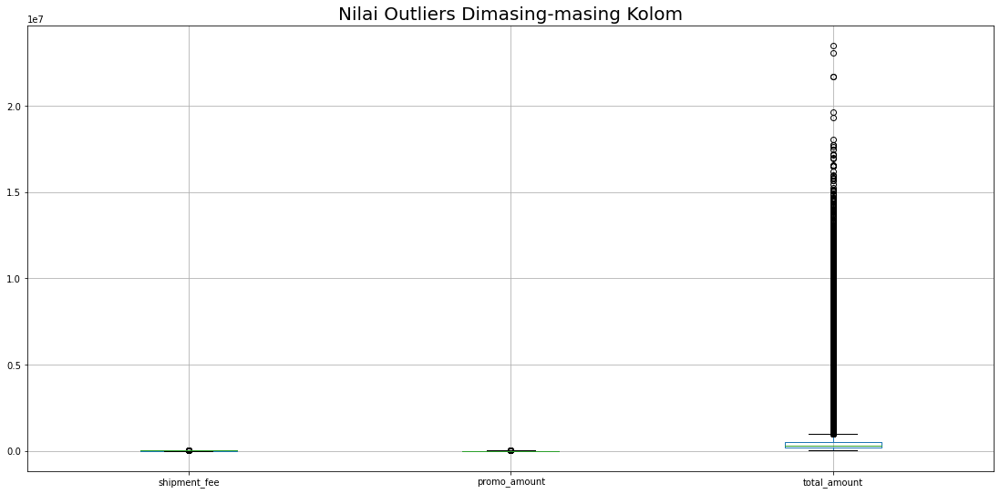

In [68]:
# Cek Data Outlier
cols = ['shipment_fee','promo_amount','total_amount']
plt.figure(figsize=(19,9))
df_trans[cols].boxplot()
plt.title('Nilai Outliers Dimasing-masing Kolom', fontsize=20)
plt.show()

In [69]:
# Cek Outliers Dengan Z Score
# Referensi : https://www.analyticsvidhya.com/blog/2021/05/detecting-and-treating-outliers-treating-the-odd-one-out/
def detect_outliers_zscore(data):
    outliers = []
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    # print(mean, std)
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers
data_outlier = {}
for col in cols:
  data_outlier[col] = detect_outliers_zscore(df_trans[col])
  print('Outliers Dengan Metode Z Score(', col, ')', len(data_outlier[col]), 'outlier :', data_outlier[col])
  print('=====================================================================================================')

Outliers Dengan Metode Z Score( shipment_fee ) 27672 outlier : [50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000, 50000

In [70]:
# # Handling Outliers (total_amount)
# mean_total_amount = np.mean(df_trans['total_amount'])
# mean_total_amount

# for i in data_outlier['total_amount']:
#     df_trans['total_amount'] = np.where(df_trans['total_amount'] == i, mean_total_amount, df_trans['total_amount'])
# detect_outliers_zscore(df_trans['total_amount'])

In [71]:
# Membuat Kolom id dengan product_id isi dari kolom product metadata
df_trans['id'] = df_trans.product_metadata.str[15:21]
df_trans['id'] = pd.to_numeric(df_trans['id'], errors='coerce')

In [72]:
# Membuat Kolom qty dengan quantity dari kolom product metadata
df_trans['qty'] = df_trans.product_metadata.str[34:36]
df_trans['qty'].replace("[^\w\s]", ' ', regex=True, inplace=True)
df_trans['qty'] = pd.to_numeric(df_trans['qty'], errors='coerce')
#df_trans['qty'].value_counts()

In [73]:
# Membuat Kolom price dengan item_price dari kolom product metadata
df_trans['price'] = df_trans.product_metadata.str[51:58]
df_trans['qty'].replace("[^\w\s]", ' ', regex=True, inplace=True)
df_trans['price'] = pd.to_numeric(df_trans['price'], errors='coerce')
#df_trans['price'].value_counts()

## Click Stream Dataset

In [74]:
df_click.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12833602 entries, 0 to 12833601
Data columns (total 6 columns):
 #   Column          Dtype 
---  ------          ----- 
 0   session_id      object
 1   event_name      object
 2   event_time      object
 3   event_id        object
 4   traffic_source  object
 5   event_metadata  object
dtypes: object(6)
memory usage: 587.5+ MB


In [75]:
df_click.shape

(12833602, 6)

In [76]:
df_click.head()

,session_id,event_name,event_time,event_id,traffic_source,event_metadata
0,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,HOMEPAGE,2019-09-06T15:54:32.821085Z,9c4388c4-c95b-4678-b5ca-e9cbc0734109,MOBILE,NaN
1,fb0abf9e-fd1a-44dd-b5c0-2834d5a4b81c,SCROLL,2019-09-06T16:03:57.821085Z,4690e1f5-3f99-42d3-84a5-22c4c4d8500a,MOBILE,NaN
2,7d440441-e67a-4d36-b324-80ffd636d166,HOMEPAGE,2019-09-01T12:05:10.322763Z,88aeaeb5-ec98-4859-852c-8abb483faf31,MOBILE,NaN
3,7d440441-e67a-4d36-b324-80ffd636d166,ADD_TO_CART,2019-09-01T12:06:33.322763Z,934e306e-ecc6-472f-9ccb-12c8536910a2,MOBILE,"{'product_id': 15315, 'quantity': 4, 'item_pri..."
4,7d440441-e67a-4d36-b324-80ffd636d166,BOOKING,2019-09-01T12:15:29.425431Z,9f4767a1-40fa-4c9c-9524-dfad18634d56,MOBILE,{'payment_status': 'Success'}


In [77]:
df_click.sample(10)

,session_id,event_name,event_time,event_id,traffic_source,event_metadata
5137491,4170b1cc-a5b8-49b2-987c-4246765150dd,ADD_TO_CART,2019-03-16T14:58:42.872469Z,92aa001c-0e7e-4881-a6d3-3c2d8c906238,MOBILE,"{'product_id': 57838, 'quantity': 1, 'item_pri..."
2035188,76472906-d957-4051-9223-d87a80d24e14,BOOKING,2019-10-23T19:00:21.333200Z,f61dd3a0-32c9-4099-9046-9298d27f2c99,MOBILE,{'payment_status': 'Success'}
5853222,0dedff6f-fd4b-4e5b-9d02-f5f5c7723bcc,HOMEPAGE,2019-01-06T13:44:58.766289Z,18b1b69f-d7c5-44ed-a27f-2802e929a03b,WEB,NaN
1012272,c9d241c9-8e2b-4bdb-87a9-2ad5f02c4ab0,CLICK,2021-09-25T21:11:11.013557Z,6599f579-cdbd-41f5-a09e-49a97d981946,MOBILE,NaN
6344011,8190458e-0370-403c-851f-daa97c5efbd0,SEARCH,2021-03-29T08:56:48.372030Z,f2c665e6-57c9-44b4-8f2a-0c0c5c14b286,MOBILE,{'search_keywords': 'Jam'}
6412211,7599f05d-e49f-4868-8c1e-af3ee047c2ab,PROMO_PAGE,2017-10-04T19:30:17.176286Z,9608f8c0-1956-4f73-b50f-a4051e07e321,MOBILE,NaN
5036510,d7fb73f9-fed5-47ee-8e2a-889471ca3856,CLICK,2018-12-08T13:44:18.416960Z,7229565c-0e08-425f-b32f-ececeb3a8ced,MOBILE,NaN
9319523,5b70b0e3-176c-4aad-ac70-521e5b30a3f1,HOMEPAGE,2021-02-12T04:47:20.384919Z,cdd8ab36-c2ff-4840-9ce5-7fee91e62904,MOBILE,NaN
10958160,7f3e5756-1d8b-49a6-83e1-b46f4f619bcb,ADD_TO_CART,2022-03-01T05:42:41.348925Z,273b04ad-9a4e-4521-9279-fb2f8617eae1,MOBILE,"{'product_id': 41713, 'quantity': 2, 'item_pri..."
1752705,cd53108c-0f9c-4930-9432-80f0fd84d219,SCROLL,2019-08-05T07:06:07.968806Z,b674a5ab-69f0-42df-b361-711c6e8b7690,MOBILE,NaN


In [78]:
df_click.isna().sum()

session_id              0
event_name              0
event_time              0
event_id                0
traffic_source          0
event_metadata    8544062
dtype: int64

In [79]:
#mengubah tipe data yang tidak sesuai
df_click['event_time'] = pd.to_datetime(df_click['event_time'])

In [80]:
#menampilkan jenis perangkat pengaksesan yang digunakan oleh customer
df_click.traffic_source.unique()

array(['MOBILE', 'WEB'], dtype=object)

In [81]:
user_android = df_customer[df_customer.device_type == "Android"]
user_ios = df_customer[df_customer.device_type == "iOS"]

In [82]:
user_jakarta = df_customer[df_customer.home_location == "Jakarta Raya"]
user_sumbar = df_customer[df_customer.home_location == "Sumatera Barat"]
user_ntb = df_customer[df_customer.home_location == "Nusa Tenggara Barat"]
user_kaltim = df_customer[df_customer.home_location == "Kalimantan Timur"]
user_kalsel = df_customer[df_customer.home_location == "Kalimantan Selatan"]
user_kepri = df_customer[df_customer.home_location == "Kepulauan Riau"]
user_bengkulu = df_customer[df_customer.home_location == "Bengkulu"]
user_jabar = df_customer[df_customer.home_location == "Jawa Barat"]
user_ntt = df_customer[df_customer.home_location == "Nusa Tenggara Timur"]
user_yogya = df_customer[df_customer.home_location == "Yogyakarta"]
user_jatim = df_customer[df_customer.home_location == "Jawa Timur"]
user_jateng = df_customer[df_customer.home_location == "Jawa Tengah"]
user_sulteng = df_customer[df_customer.home_location == "Sulawesi Tenggara"]
user_lampung = df_customer[df_customer.home_location == "Lampung"]
user_bangka = df_customer[df_customer.home_location == "Bangka Belitung"]
user_maluku = df_customer[df_customer.home_location == "Maluku"]
user_sulut = df_customer[df_customer.home_location == "Sulawesi Utara"]
user_sulbar = df_customer[df_customer.home_location == "Sulawesi Barat"]
user_jambi = df_customer[df_customer.home_location == "Jambi"]
user_kalteng = df_customer[df_customer.home_location == "Kalimantan Tengah"]
user_sumut = df_customer[df_customer.home_location == "Sumatera Utara"]
user_kalbar = df_customer[df_customer.home_location == "Kalimantan Barat"]
user_papbar = df_customer[df_customer.home_location == "Papua Barat"]
user_sulsel = df_customer[df_customer.home_location == "Sulawesi Selatan"]
user_malut = df_customer[df_customer.home_location == "Maluku Utara"]
user_banten = df_customer[df_customer.home_location == "Banten"]
user_bali = df_customer[df_customer.home_location == "Bali"]
user_riau = df_customer[df_customer.home_location == "Riau"]
user_sumsel = df_customer[df_customer.home_location == "Sumatera Selatan"]
user_aceh = df_customer[df_customer.home_location == "Aceh"]
user_papua = df_customer[df_customer.home_location == "Papua"]
user_sulteng = df_customer[df_customer.home_location == "Sulawesi Tengah"]
user_gorontalo = df_customer[df_customer.home_location == "Gorontalo"]

In [83]:
daftar_month = df_customer["first_join_date"].dt.month
daftar_year = df_customer["first_join_date"].dt.year
daftar_day = df_customer["first_join_date"].dt.day

birth_year = df_customer["birthdate"].dt.year
birth_month = df_customer["birthdate"].dt.year
birth_day = df_customer["birthdate"].dt.day

In [84]:
user_female = df_customer[df_customer.gender == "Female"]
user_male = df_customer[df_customer.gender == "Male"]

In [85]:
product_apparel = df_product[df_product.masterCategory == "Apparel"]
product_acc = df_product[df_product.masterCategory == "Accessories"]
product_footwear = df_product[df_product.masterCategory == "Footwear"]
product_pesonal = df_product[df_product.masterCategory == "Personal Care"]
product_free = df_product[df_product.masterCategory == "Free Items"]
product_sport = df_product[df_product.masterCategory == "Sporting Goods"]
product_home = df_product[df_product.masterCategory == "Home"]

# Machine Learning

### Feature Engineering

In [86]:
%%time
# Merge dataset
df = pd.merge(df_click,df_trans,how='left',on='session_id' )
df = pd.merge(df, fixed_product,how='left',on='id' )
df = pd.merge(df, df_customer, how='left', on='customer_id')

CPU times: total: 3min 46s
Wall time: 6min 16s


In [87]:
print(df.created_at.min())
print(df.created_at.max())

2016-06-30 23:18:44.792905+00:00
2022-07-31 23:59:45.821469+00:00


In [88]:
# data ini akan digunakan untuk membuat model
df_1 = df[df['created_at'] <= '2022-04-01 00:00:00']
df_1 = df_1.sort_values(by='created_at', ascending=True)
df_1.shape

(10697496, 45)

In [89]:
# # data ini akan digunakan untuk prediksi
# df_2 = df[df['created_at'] > '2022-04-01 00:00:00']
# df_2 = df_2.sort_values(by='created_at', ascending=True)
# df_2.shape

In [90]:
print(df_1.shape)
# print(df_2.shape)

(10697496, 45)


In [91]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10697496 entries, 12371567 to 12430404
Data columns (total 45 columns):
 #   Column                  Dtype              
---  ------                  -----              
 0   session_id              object             
 1   event_name              object             
 2   event_time              datetime64[ns, UTC]
 3   event_id                object             
 4   traffic_source          object             
 5   event_metadata          object             
 6   created_at              datetime64[ns, UTC]
 7   customer_id             float64            
 8   booking_id              object             
 9   product_metadata        object             
 10  payment_method          object             
 11  payment_status          object             
 12  promo_amount            float64            
 13  promo_code              object             
 14  shipment_fee            float64            
 15  shipment_date_limit     datetime64[ns, U

In [92]:
# membuat features tahun dilakukannya pembelian
df_1["purchase_year"] = df_1.created_at.dt.year

In [93]:
gender_codes = {'F': 0, 'M': 1}
df_1['gender'] = df_1.gender.map(gender_codes)
df_1.gender = df_1.gender.astype('category')

In [94]:
device_codes = {'Android': 0, 'iOS': 1}
df_1['device_type'] = df_1.device_type.map(device_codes)
df_1.device_type = df_1.device_type.astype('category')

In [95]:
df_1.created_at.max()

Timestamp('2022-03-31 23:59:05.916802+0000', tz='UTC')

In [96]:
df_1['age'] =  df_1.created_at.dt.year.max() - df_1.birthdate.dt.year

In [97]:
df_1.age.min()

6

In [98]:
recency = df_1.groupby(['customer_id'])['created_at'].max()
recency = pd.DataFrame(data = recency).reset_index()

recency['recent_days'] = recency['created_at'].max() - recency['created_at']
recency['recent_days'] = recency['recent_days'].dt.days

In [99]:
frequency = pd.DataFrame(df_1.groupby('customer_id')['booking_id'].count())

In [100]:
monetary = pd.DataFrame(df_1[['customer_id','total_amount']].groupby('customer_id')['total_amount'].sum())

In [101]:
df_rfm = pd.merge(recency, frequency, on='customer_id')
df_rfm = pd.merge(df_rfm, monetary, on='customer_id')

df_rfm = df_rfm.rename(columns = {'booking_id' : 'frequency'})
df_rfm = df_rfm.rename(columns = {'total_amount' : 'monetary'})
df_rfm.head()

,customer_id,created_at,recent_days,frequency,monetary
0,3.0,2022-03-06 13:28:13.844494+00:00,25,641,290808627.0
1,8.0,2022-02-28 21:54:59.656991+00:00,31,198,59104320.0
2,9.0,2022-03-22 05:56:29.421034+00:00,9,54,31757480.0
3,11.0,2022-03-07 14:29:13.759159+00:00,24,14,2765462.0
4,15.0,2022-01-05 06:07:58.105040+00:00,85,57,23704990.0


In [102]:
df_rfm.describe()

,customer_id,recent_days,frequency,monetary
count,47664.000000,47664.000000,47664.000000,4.766400e+04
mean,49789.398875,244.434353,224.435549,1.396021e+08
std,28979.281132,415.962755,445.759041,2.874845e+08
min,3.000000,0.000000,4.000000,1.804350e+05
25%,24665.500000,15.000000,20.000000,7.442632e+06
50%,49655.500000,55.000000,63.000000,3.311592e+07
75%,74868.250000,258.000000,215.000000,1.335513e+08
max,99999.000000,2099.000000,9254.000000,6.330902e+09


In [103]:
df_rfm['R_rank'] = df_rfm['recent_days'].rank(ascending=False)
df_rfm['F_rank'] = df_rfm['frequency'].rank(ascending=True)
df_rfm['M_rank'] = df_rfm['monetary'].rank(ascending=True)

# normalizing the rank of the customers
df_rfm['R_rank_norm'] = (df_rfm['R_rank']/df_rfm['R_rank'].max())*100
df_rfm['F_rank_norm'] = (df_rfm['F_rank']/df_rfm['F_rank'].max())*100
df_rfm['M_rank_norm'] = (df_rfm['F_rank']/df_rfm['M_rank'].max())*100

df_rfm.drop(columns=['R_rank', 'F_rank', 'M_rank'], inplace=True)

In [104]:
# referensi: https://www.geeksforgeeks.org/rfm-analysis-analysis-using-python/
df_rfm['RFM_Score'] = 0.15*df_rfm['R_rank_norm']+0.28 * df_rfm['F_rank_norm']+0.57*df_rfm['M_rank_norm']
df_rfm['RFM_Score'] *= 0.05
df_rfm = df_rfm.round(2)
df_rfm.head(7)

,customer_id,created_at,recent_days,frequency,monetary,R_rank_norm,F_rank_norm,M_rank_norm,RFM_Score
0,3.0,2022-03-06 13:28:13.844494+00:00,25,641,290808627.0,65.97,90.54,90.54,4.34
1,8.0,2022-02-28 21:54:59.656991+00:00,31,198,59104320.0,61.96,73.49,73.49,3.59
2,9.0,2022-03-22 05:56:29.421034+00:00,9,54,31757480.0,83.29,46.73,46.73,2.61
3,11.0,2022-03-07 14:29:13.759159+00:00,24,14,2765462.0,66.86,18.65,18.65,1.29
4,15.0,2022-01-05 06:07:58.105040+00:00,85,57,23704990.0,42.11,47.95,47.95,2.35
5,17.0,2020-09-27 13:52:19.521918+00:00,550,15,2930515.0,15.11,19.90,19.90,0.96
6,18.0,2022-02-23 20:06:28.010289+00:00,36,433,197516349.0,59.01,85.86,85.86,4.09


In [105]:
df_rfm["Customer_segment"] = np.where(df_rfm['RFM_Score'] >
                                    4.5, "Top Customers",
                                    (np.where(df_rfm['RFM_Score'] > 4,
                                        "High value Customer",
                                        (np.where(df_rfm['RFM_Score'] > 3,
                            "Medium Value Customer",
                            np.where(df_rfm['RFM_Score'] > 1.6,
                            'Low Value Customers', 'Lost Customers'))))))
df_rfm.sort_values("customer_id", ascending=True)

,customer_id,created_at,recent_days,frequency,monetary,R_rank_norm,F_rank_norm,M_rank_norm,RFM_Score,Customer_segment
0,3.0,2022-03-06 13:28:13.844494+00:00,25,641,290808627.0,65.97,90.54,90.54,4.34,High value Customer
1,8.0,2022-02-28 21:54:59.656991+00:00,31,198,59104320.0,61.96,73.49,73.49,3.59,Medium Value Customer
2,9.0,2022-03-22 05:56:29.421034+00:00,9,54,31757480.0,83.29,46.73,46.73,2.61,Low Value Customers
3,11.0,2022-03-07 14:29:13.759159+00:00,24,14,2765462.0,66.86,18.65,18.65,1.29,Lost Customers
4,15.0,2022-01-05 06:07:58.105040+00:00,85,57,23704990.0,42.11,47.95,47.95,2.35,Low Value Customers
...,...,...,...,...,...,...,...,...,...,...
47659,99992.0,2022-03-23 08:45:11.873510+00:00,8,87,45335887.0,84.84,57.02,57.02,3.06,Medium Value Customer
47660,99995.0,2022-03-31 00:14:23.810263+00:00,0,789,439773103.0,100.00,92.60,92.60,4.69,Top Customers
47661,99997.0,2020-04-25 18:38:16.825127+00:00,705,10,2264610.0,11.69,13.03,13.03,0.64,Lost Customers
47662,99998.0,2022-01-25 00:54:09.703960+00:00,65,354,236369831.0,46.70,83.09,83.09,3.88,Medium Value Customer


In [106]:
table = df_1.pivot_table(
    values="session_id", 
    index='customer_id', 
    columns='event_name', 
    aggfunc='count')

In [107]:
act_cust = table.reset_index()

In [108]:
act_cust

event_name,customer_id,ADD_PROMO,ADD_TO_CART,BOOKING,CLICK,HOMEPAGE,ITEM_DETAIL,PROMO_PAGE,SCROLL,SEARCH
0,3.0,24.0,145.0,47.0,111.0,103.0,52.0,40.0,70.0,49.0
1,8.0,1.0,12.0,6.0,25.0,92.0,32.0,5.0,16.0,9.0
2,9.0,NaN,15.0,5.0,9.0,7.0,5.0,3.0,6.0,4.0
3,11.0,1.0,4.0,1.0,1.0,3.0,2.0,2.0,NaN,NaN
4,15.0,4.0,21.0,5.0,9.0,9.0,3.0,1.0,2.0,3.0
...,...,...,...,...,...,...,...,...,...,...
47659,99992.0,2.0,28.0,11.0,14.0,15.0,2.0,1.0,9.0,5.0
47660,99995.0,11.0,68.0,50.0,173.0,152.0,111.0,32.0,96.0,96.0
47661,99997.0,NaN,4.0,1.0,2.0,1.0,NaN,1.0,1.0,NaN
47662,99998.0,6.0,40.0,8.0,31.0,169.0,35.0,16.0,33.0,16.0


In [109]:
pembelian_awal = df_1.groupby(['customer_id'])['created_at'].min()
pembelian_awal = pd.DataFrame(data = pembelian_awal).reset_index()
pembelian_awal = pembelian_awal.rename(columns = {'created_at' : 'initial_purchase_date'})
pembelian_awal.head()

,customer_id,initial_purchase_date
0,3.0,2018-08-25 18:54:03.844494+00:00
1,8.0,2021-02-13 09:47:39.656991+00:00
2,9.0,2021-06-27 01:51:48.421034+00:00
3,11.0,2022-03-07 14:29:13.759159+00:00
4,15.0,2019-09-30 04:47:36.105040+00:00


In [110]:
pembelian_akhir = df_1.groupby(['customer_id'])['created_at'].max()
pembelian_akhir = pd.DataFrame(data = pembelian_akhir).reset_index()
pembelian_akhir = pembelian_akhir.rename(columns = {'created_at' : 'last_purchase_date'})
pembelian_akhir.head()

,customer_id,last_purchase_date
0,3.0,2022-03-06 13:28:13.844494+00:00
1,8.0,2022-02-28 21:54:59.656991+00:00
2,9.0,2022-03-22 05:56:29.421034+00:00
3,11.0,2022-03-07 14:29:13.759159+00:00
4,15.0,2022-01-05 06:07:58.105040+00:00


In [111]:
new_df = pd.merge(pembelian_awal, pembelian_akhir, on='customer_id')
df_rfm = pd.merge(new_df, df_rfm, on='customer_id')

In [112]:
df_rfm["tenure"] = (df_rfm.last_purchase_date - df_rfm.initial_purchase_date).dt.days/30

In [113]:
df_rfm["monthly_spend"] = np.round(df_rfm.monetary / df_rfm.tenure, 2)

In [114]:
df_rfm["monthly_spend"].replace([np.inf, -np.inf], np.nan, inplace=True)
df_rfm["monthly_spend"].fillna(df_rfm.monetary, inplace=True)

In [115]:
df_rfm.describe()

,customer_id,recent_days,frequency,monetary,R_rank_norm,F_rank_norm,M_rank_norm,RFM_Score,tenure,monthly_spend
count,47664.000000,47664.000000,47664.000000,4.766400e+04,47664.000000,47664.000000,47664.000000,47664.000000,47664.000000,4.766400e+04
mean,49789.398875,244.434353,224.435549,1.396021e+08,50.474639,50.001277,50.001277,2.503601,22.405133,7.652222e+06
std,28979.281132,415.962755,445.759041,2.874845e+08,29.140087,28.866272,28.866272,1.392751,19.926966,1.573172e+07
min,3.000000,0.000000,4.000000,1.804350e+05,0.000000,1.440000,1.440000,0.060000,0.000000,3.690178e+04
25%,24665.500000,15.000000,20.000000,7.442632e+06,25.240000,25.240000,25.240000,1.290000,3.433333,1.089706e+06
50%,49655.500000,55.000000,63.000000,3.311592e+07,50.470000,50.170000,50.170000,2.500000,18.666667,2.737404e+06
75%,74868.250000,258.000000,215.000000,1.335513e+08,75.270000,74.970000,74.970000,3.700000,37.333333,7.739529e+06
max,99999.000000,2099.000000,9254.000000,6.330902e+09,100.000000,100.000000,100.000000,5.000000,69.900000,6.507404e+08


In [116]:
df_rfm["monthly_spend"]

0         6773492.86
1         4666130.53
2         3554941.79
3         2765462.00
4          858876.45
            ...     
47659     2158851.76
47660    22437403.21
47661     2264610.00
47662     5446309.47
47663     6471663.00
Name: monthly_spend, Length: 47664, dtype: float64

In [117]:
# membuat feature berapa lama antara pembelian pertama dan pembelian selanjutnya
df_rfm["freq_diff"] = df_rfm['recent_days'] / df_rfm['frequency']

In [118]:
# Membuat data dari 3 bulan terakhir
data_last_months = df_1[(df_1['created_at'] > '2022-01-01 00:00:00') & (df_1['created_at'] <= '2022-04-01 00:00:00')]
# data_last_months.sort_values(by='order_purchase_timestamp', ascending=True)

s = pd.merge(df_rfm, data_last_months, left_on='customer_id',right_on='customer_id',how='left')
df_rfm['purchased_3m'] = s.customer_id.notnull().astype(int)
df_rfm['purchased_3m'].isna().sum()

0

In [119]:
#mengubah 
df_rfm.purchased_3m = df_rfm.purchased_3m.astype('category')

In [120]:
df_rfm.Customer_segment.value_counts()

Lost Customers           15092
Low Value Customers      13728
Medium Value Customer     9863
High value Customer       4881
Top Customers             4100
Name: Customer_segment, dtype: int64

In [121]:
df_rfm.groupby("Customer_segment")["recent_days"].mean()

Customer_segment
High value Customer       13.989346
Lost Customers           614.883978
Low Value Customers      140.279793
Medium Value Customer     35.457467
Top Customers              6.617073
Name: recent_days, dtype: float64

In [122]:
#membuat churn label
# referensi: https://www.linkedin.com/pulse/customer-churn-analysis-oversimplified-wrong-ian-pollard/
churn = []
for status, recent_days in zip(df_rfm.Customer_segment, df_rfm.recent_days):
    if status == "Lost Customers":
        churn.append(1)
    elif status == "Low Value Customers":
        if recent_days > 140:
            churn.append(1)
        else:
            churn.append(0)
    elif status == "Medium Value Customer":
        if recent_days > 35:
            churn.append(1)
        else:
            churn.append(0)
    elif status == "High value Customer":
        if recent_days > 14:
            churn.append(1)
        else:
            churn.append(0)
    elif status == "Top Customers":
        if recent_days > 7:
            churn.append(1)
        else:
            churn.append(0)

In [123]:
pd_churn = pd.DataFrame(churn, columns = ['churn'])
df_rfm['churn'] = pd_churn
df_rfm['churn'].value_counts()

1    26395
0    21269
Name: churn, dtype: int64

In [124]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10697496 entries, 12371567 to 12430404
Data columns (total 47 columns):
 #   Column                  Dtype              
---  ------                  -----              
 0   session_id              object             
 1   event_name              object             
 2   event_time              datetime64[ns, UTC]
 3   event_id                object             
 4   traffic_source          object             
 5   event_metadata          object             
 6   created_at              datetime64[ns, UTC]
 7   customer_id             float64            
 8   booking_id              object             
 9   product_metadata        object             
 10  payment_method          object             
 11  payment_status          object             
 12  promo_amount            float64            
 13  promo_code              object             
 14  shipment_fee            float64            
 15  shipment_date_limit     datetime64[ns, U

## Merge data

In [125]:
fixed_df = df_1.drop_duplicates(subset = ["customer_id"])

In [126]:
df = pd.merge(fixed_df, df_rfm, on='customer_id', how="inner")
df = pd.merge(df, act_cust, on='customer_id', how="inner")

In [127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47664 entries, 0 to 47663
Data columns (total 72 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   session_id              47664 non-null  object             
 1   event_name              47664 non-null  object             
 2   event_time              47664 non-null  datetime64[ns, UTC]
 3   event_id                47664 non-null  object             
 4   traffic_source          47664 non-null  object             
 5   event_metadata          19863 non-null  object             
 6   created_at_x            47664 non-null  datetime64[ns, UTC]
 7   customer_id             47664 non-null  float64            
 8   booking_id              47664 non-null  object             
 9   product_metadata        47664 non-null  object             
 10  payment_method          47664 non-null  object             
 11  payment_status          47664 non-null  o

In [128]:
df = df[["customer_id", "age", "home_location", "purchase_year", "payment_method", "promo_amount", "shipment_fee", "device_type", "gender", "recent_days", "frequency", "monetary", "RFM_Score", "Customer_segment", "tenure", "monthly_spend", "freq_diff", "purchased_3m", "ADD_PROMO", "ADD_TO_CART", "BOOKING", "CLICK", "HOMEPAGE", "ITEM_DETAIL", "PROMO_PAGE", "SCROLL", "SEARCH", "churn"]]

In [129]:
df.duplicated().sum()

0

In [130]:
df.isna().sum()

customer_id             0
age                     0
home_location           0
purchase_year           0
payment_method          0
promo_amount            0
shipment_fee            0
device_type             0
gender                  0
recent_days             0
frequency               0
monetary                0
RFM_Score               0
Customer_segment        0
tenure                  0
monthly_spend           0
freq_diff               0
purchased_3m            0
ADD_PROMO           11730
ADD_TO_CART             0
BOOKING                 0
CLICK                4030
HOMEPAGE                0
ITEM_DETAIL          6879
PROMO_PAGE          11575
SCROLL               6322
SEARCH               8550
churn                   0
dtype: int64

In [131]:
#mengubah nilai null pada aktivitas customer dengan 0
# df = df[["ADD_PROMO","CLICK", "ITEM_DETAIL", "PROMO_PAGE", "SCROLL", "SEARCH"]].fillna(0, inplace=True)
df = df.replace(np.nan, 0)

In [132]:
df.isna().sum()

customer_id         0
age                 0
home_location       0
purchase_year       0
payment_method      0
promo_amount        0
shipment_fee        0
device_type         0
gender              0
recent_days         0
frequency           0
monetary            0
RFM_Score           0
Customer_segment    0
tenure              0
monthly_spend       0
freq_diff           0
purchased_3m        0
ADD_PROMO           0
ADD_TO_CART         0
BOOKING             0
CLICK               0
HOMEPAGE            0
ITEM_DETAIL         0
PROMO_PAGE          0
SCROLL              0
SEARCH              0
churn               0
dtype: int64

In [133]:
df.corr()

,customer_id,age,purchase_year,promo_amount,shipment_fee,recent_days,frequency,monetary,RFM_Score,tenure,...,ADD_PROMO,ADD_TO_CART,BOOKING,CLICK,HOMEPAGE,ITEM_DETAIL,PROMO_PAGE,SCROLL,SEARCH,churn
customer_id,1.000000,-0.003271,0.004737,0.002823,0.004550,-0.004275,0.000627,-0.000913,-0.000369,-0.000785,...,-0.000228,-0.000005,0.000677,0.000425,0.001560,0.000216,0.000893,0.000186,0.000995,-0.001064
age,-0.003271,1.000000,0.000681,-0.004286,0.001689,0.003716,-0.009695,-0.010391,-0.004931,-0.001635,...,-0.013151,-0.013462,-0.010468,-0.007554,-0.010607,-0.008032,-0.010273,-0.007300,-0.006800,0.000961
purchase_year,0.004737,0.000681,1.000000,-0.137963,0.001045,-0.336157,-0.234727,-0.226873,-0.185701,-0.743635,...,-0.314536,-0.301364,-0.263320,-0.200129,-0.228749,-0.207251,-0.240823,-0.189256,-0.183507,-0.247751
promo_amount,0.002823,-0.004286,-0.137963,1.000000,-0.005110,0.048568,0.020626,0.018369,0.043864,0.097811,...,0.074371,0.033467,0.020518,0.015248,0.017015,0.013143,0.031334,0.012704,0.012183,0.037237
shipment_fee,0.004550,0.001689,0.001045,-0.005110,1.000000,-0.003622,0.011696,0.013476,0.007571,0.002508,...,0.011114,0.010266,0.012076,0.011279,0.011394,0.011930,0.011578,0.011103,0.010977,-0.004259
recent_days,-0.004275,0.003716,-0.336157,0.048568,-0.003622,1.000000,-0.255478,-0.246053,-0.614133,-0.359488,...,-0.240284,-0.268172,-0.273652,-0.235953,-0.252478,-0.245490,-0.246072,-0.229628,-0.226272,0.462413
frequency,0.000627,-0.009695,-0.234727,0.020626,0.011696,-0.255478,1.000000,0.956324,0.625013,0.415031,...,0.935767,0.833327,0.976246,0.984468,0.984591,0.990008,0.986472,0.975420,0.970893,-0.176376
monetary,-0.000913,-0.010391,-0.226873,0.018369,0.013476,-0.246053,0.956324,1.000000,0.601925,0.400633,...,0.897569,0.827003,0.935205,0.935722,0.937470,0.942566,0.938680,0.925854,0.921972,-0.168368
RFM_Score,-0.000369,-0.004931,-0.185701,0.043864,0.007571,-0.614133,0.625013,0.601925,1.000000,0.613040,...,0.583738,0.609500,0.640232,0.589144,0.621326,0.608539,0.610309,0.577104,0.570581,-0.501454
tenure,-0.000785,-0.001635,-0.743635,0.097811,0.002508,-0.359488,0.415031,0.400633,0.613040,1.000000,...,0.481640,0.490611,0.456696,0.366762,0.406874,0.380737,0.414044,0.351461,0.343408,-0.070970


## EDA

In [134]:
import plotly.express as px
import matplotlib

In [135]:
px.histogram(df, x='home_location', title='Province vs. Churn', color='churn')

In [136]:
px.histogram(df, x='Customer_segment', title='Recency vs. Churn', color='churn')

In [137]:
px.histogram(df, x='frequency', title='Frequency vs. Churn', color='churn')

In [138]:
px.histogram(df, x='monetary', title='Monetary vs. Churn', color='churn')

In [139]:
px.histogram(df, x='recent_days', title='Recency vs. Churn', color='churn')

In [140]:
px.scatter(df.sample(20000), 
           title='frequency vs recent_days',
           x='frequency', 
           y='recent_days', 
           color='churn')

In [141]:
px.scatter(df.sample(20000), 
           title='monetary vs recent_days',
           x='monetary', 
           y='recent_days', 
           color='churn')

## Modelling

In [142]:
df.corr()

,customer_id,age,purchase_year,promo_amount,shipment_fee,recent_days,frequency,monetary,RFM_Score,tenure,...,ADD_PROMO,ADD_TO_CART,BOOKING,CLICK,HOMEPAGE,ITEM_DETAIL,PROMO_PAGE,SCROLL,SEARCH,churn
customer_id,1.000000,-0.003271,0.004737,0.002823,0.004550,-0.004275,0.000627,-0.000913,-0.000369,-0.000785,...,-0.000228,-0.000005,0.000677,0.000425,0.001560,0.000216,0.000893,0.000186,0.000995,-0.001064
age,-0.003271,1.000000,0.000681,-0.004286,0.001689,0.003716,-0.009695,-0.010391,-0.004931,-0.001635,...,-0.013151,-0.013462,-0.010468,-0.007554,-0.010607,-0.008032,-0.010273,-0.007300,-0.006800,0.000961
purchase_year,0.004737,0.000681,1.000000,-0.137963,0.001045,-0.336157,-0.234727,-0.226873,-0.185701,-0.743635,...,-0.314536,-0.301364,-0.263320,-0.200129,-0.228749,-0.207251,-0.240823,-0.189256,-0.183507,-0.247751
promo_amount,0.002823,-0.004286,-0.137963,1.000000,-0.005110,0.048568,0.020626,0.018369,0.043864,0.097811,...,0.074371,0.033467,0.020518,0.015248,0.017015,0.013143,0.031334,0.012704,0.012183,0.037237
shipment_fee,0.004550,0.001689,0.001045,-0.005110,1.000000,-0.003622,0.011696,0.013476,0.007571,0.002508,...,0.011114,0.010266,0.012076,0.011279,0.011394,0.011930,0.011578,0.011103,0.010977,-0.004259
recent_days,-0.004275,0.003716,-0.336157,0.048568,-0.003622,1.000000,-0.255478,-0.246053,-0.614133,-0.359488,...,-0.240284,-0.268172,-0.273652,-0.235953,-0.252478,-0.245490,-0.246072,-0.229628,-0.226272,0.462413
frequency,0.000627,-0.009695,-0.234727,0.020626,0.011696,-0.255478,1.000000,0.956324,0.625013,0.415031,...,0.935767,0.833327,0.976246,0.984468,0.984591,0.990008,0.986472,0.975420,0.970893,-0.176376
monetary,-0.000913,-0.010391,-0.226873,0.018369,0.013476,-0.246053,0.956324,1.000000,0.601925,0.400633,...,0.897569,0.827003,0.935205,0.935722,0.937470,0.942566,0.938680,0.925854,0.921972,-0.168368
RFM_Score,-0.000369,-0.004931,-0.185701,0.043864,0.007571,-0.614133,0.625013,0.601925,1.000000,0.613040,...,0.583738,0.609500,0.640232,0.589144,0.621326,0.608539,0.610309,0.577104,0.570581,-0.501454
tenure,-0.000785,-0.001635,-0.743635,0.097811,0.002508,-0.359488,0.415031,0.400633,0.613040,1.000000,...,0.481640,0.490611,0.456696,0.366762,0.406874,0.380737,0.414044,0.351461,0.343408,-0.070970


In [143]:
from sklearn.model_selection import train_test_split

In [144]:
train_val_df, test_df = train_test_split(df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [145]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (28598, 28)
val_df.shape : (9533, 28)
test_df.shape : (9533, 28)


In [146]:
input_cols = list(df.columns)[1:-1]
target_col = 'churn'

In [147]:
print(input_cols)

['age', 'home_location', 'purchase_year', 'payment_method', 'promo_amount', 'shipment_fee', 'device_type', 'gender', 'recent_days', 'frequency', 'monetary', 'RFM_Score', 'Customer_segment', 'tenure', 'monthly_spend', 'freq_diff', 'purchased_3m', 'ADD_PROMO', 'ADD_TO_CART', 'BOOKING', 'CLICK', 'HOMEPAGE', 'ITEM_DETAIL', 'PROMO_PAGE', 'SCROLL', 'SEARCH']


In [148]:
target_col

'churn'

In [149]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [150]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [151]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

In [152]:
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

### Feature Scalling

In [153]:
df[numeric_cols].describe()

,age,purchase_year,promo_amount,shipment_fee,recent_days,frequency,monetary,RFM_Score,tenure,monthly_spend,freq_diff,ADD_PROMO,ADD_TO_CART,BOOKING,CLICK,HOMEPAGE,ITEM_DETAIL,PROMO_PAGE,SCROLL,SEARCH
count,47664.000000,47664.000000,47664.000000,47664.000000,47664.000000,47664.000000,4.766400e+04,47664.000000,47664.000000,4.766400e+04,47664.000000,47664.000000,47664.000000,47664.000000,47664.000000,47664.000000,47664.000000,47664.000000,47664.000000,47664.000000
mean,26.521589,2019.238650,1901.640714,9193.940920,244.434353,224.435549,1.396021e+08,2.503601,22.405133,7.652222e+06,23.234886,6.112244,35.283212,15.515106,42.871916,43.325906,22.332956,10.449123,28.485482,20.059605
std,7.279030,1.663032,2945.145133,9404.662047,415.962755,445.759041,2.874845e+08,1.392751,19.926966,1.573172e+07,59.893559,12.492984,62.366891,28.117446,94.295173,87.106370,46.801253,21.539273,64.905353,46.514631
min,6.000000,2016.000000,0.000000,0.000000,0.000000,4.000000,1.804350e+05,0.060000,0.000000,3.690178e+04,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,21.000000,2018.000000,0.000000,0.000000,15.000000,20.000000,7.442632e+06,1.290000,3.433333,1.089706e+06,0.070968,1.000000,5.000000,2.000000,3.000000,3.000000,1.000000,1.000000,2.000000,1.000000
50%,26.000000,2019.000000,0.000000,10000.000000,55.000000,63.000000,3.311592e+07,2.500000,18.666667,2.737404e+06,0.813260,2.000000,14.000000,5.000000,10.000000,11.000000,6.000000,3.000000,6.000000,4.000000
75%,31.000000,2021.000000,3755.000000,10000.000000,258.000000,215.000000,1.335513e+08,3.700000,37.333333,7.739529e+06,11.785714,6.000000,40.000000,16.000000,36.000000,41.000000,20.000000,10.000000,22.000000,16.000000
max,68.000000,2022.000000,23019.000000,50000.000000,2099.000000,9254.000000,6.330902e+09,5.000000,69.900000,6.507404e+08,522.750000,333.000000,1517.000000,519.000000,2046.000000,1759.000000,976.000000,479.000000,1439.000000,1001.000000


In [154]:
from sklearn.preprocessing import MinMaxScaler

In [155]:
scaler = MinMaxScaler()
scaler.fit(df[numeric_cols])

MinMaxScaler()

In [156]:
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [157]:
train_inputs[numeric_cols].describe()

,age,purchase_year,promo_amount,shipment_fee,recent_days,frequency,monetary,RFM_Score,tenure,monthly_spend,freq_diff,ADD_PROMO,ADD_TO_CART,BOOKING,CLICK,HOMEPAGE,ITEM_DETAIL,PROMO_PAGE,SCROLL,SEARCH
count,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000,28598.000000
mean,0.330968,0.540172,0.081707,0.184719,0.115919,0.023637,0.021871,0.494961,0.320828,0.011670,0.044457,0.018251,0.022660,0.027904,0.020690,0.023922,0.022631,0.021577,0.019564,0.019777
std,0.117394,0.277469,0.127395,0.190102,0.197737,0.047308,0.044709,0.282056,0.285548,0.024179,0.114438,0.036825,0.040833,0.053564,0.045129,0.048793,0.046917,0.044057,0.044281,0.045362
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.241935,0.333333,0.000000,0.000000,0.006670,0.001730,0.001153,0.246964,0.047687,0.001640,0.000133,0.003003,0.002639,0.001931,0.001466,0.001138,0.001025,0.002088,0.001390,0.000999
50%,0.322581,0.500000,0.000000,0.200000,0.026203,0.006486,0.005249,0.495951,0.267525,0.004141,0.001533,0.006006,0.008575,0.007722,0.004888,0.005688,0.006148,0.006263,0.004170,0.003996
75%,0.403226,0.833333,0.162083,0.200000,0.121486,0.022811,0.020973,0.734818,0.536481,0.011878,0.022345,0.018018,0.026385,0.028958,0.017595,0.022753,0.020492,0.020877,0.015288,0.015984
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.999523,1.000000,1.000000,1.000000,0.850264,1.000000,1.000000,1.000000,0.975410,1.000000,1.000000,0.976024


### One Hot Encoding

In [158]:
df[categorical_cols].nunique()

home_location       33
payment_method       5
Customer_segment     5
dtype: int64

In [159]:
from sklearn.preprocessing import OneHotEncoder

In [160]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
encoder.fit(df[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [161]:
encoder.categories_

[array(['Aceh', 'Bali', 'Bangka Belitung', 'Banten', 'Bengkulu',
        'Gorontalo', 'Jakarta Raya', 'Jambi', 'Jawa Barat', 'Jawa Tengah',
        'Jawa Timur', 'Kalimantan Barat', 'Kalimantan Selatan',
        'Kalimantan Tengah', 'Kalimantan Timur', 'Kepulauan Riau',
        'Lampung', 'Maluku', 'Maluku Utara', 'Nusa Tenggara Barat',
        'Nusa Tenggara Timur', 'Papua', 'Papua Barat', 'Riau',
        'Sulawesi Barat', 'Sulawesi Selatan', 'Sulawesi Tengah',
        'Sulawesi Tenggara', 'Sulawesi Utara', 'Sumatera Barat',
        'Sumatera Selatan', 'Sumatera Utara', 'Yogyakarta'], dtype=object),
 array(['Credit Card', 'Debit Card', 'Gopay', 'LinkAja', 'OVO'],
       dtype=object),
 array(['High value Customer', 'Lost Customers', 'Low Value Customers',
        'Medium Value Customer', 'Top Customers'], dtype=object)]

In [162]:
encoded_cols = list(encoder.get_feature_names(categorical_cols))
print(encoded_cols)

['home_location_Aceh', 'home_location_Bali', 'home_location_Bangka Belitung', 'home_location_Banten', 'home_location_Bengkulu', 'home_location_Gorontalo', 'home_location_Jakarta Raya', 'home_location_Jambi', 'home_location_Jawa Barat', 'home_location_Jawa Tengah', 'home_location_Jawa Timur', 'home_location_Kalimantan Barat', 'home_location_Kalimantan Selatan', 'home_location_Kalimantan Tengah', 'home_location_Kalimantan Timur', 'home_location_Kepulauan Riau', 'home_location_Lampung', 'home_location_Maluku', 'home_location_Maluku Utara', 'home_location_Nusa Tenggara Barat', 'home_location_Nusa Tenggara Timur', 'home_location_Papua', 'home_location_Papua Barat', 'home_location_Riau', 'home_location_Sulawesi Barat', 'home_location_Sulawesi Selatan', 'home_location_Sulawesi Tengah', 'home_location_Sulawesi Tenggara', 'home_location_Sulawesi Utara', 'home_location_Sumatera Barat', 'home_location_Sumatera Selatan', 'home_location_Sumatera Utara', 'home_location_Yogyakarta', 'payment_method_C

D:\Anaconda\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [163]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

In [164]:
pd.set_option('display.max_columns', None)

In [165]:
val_inputs.columns

Index(['age', 'home_location', 'purchase_year', 'payment_method',
       'promo_amount', 'shipment_fee', 'device_type', 'gender', 'recent_days',
       'frequency', 'monetary', 'RFM_Score', 'Customer_segment', 'tenure',
       'monthly_spend', 'freq_diff', 'purchased_3m', 'ADD_PROMO',
       'ADD_TO_CART', 'BOOKING', 'CLICK', 'HOMEPAGE', 'ITEM_DETAIL',
       'PROMO_PAGE', 'SCROLL', 'SEARCH', 'home_location_Aceh',
       'home_location_Bali', 'home_location_Bangka Belitung',
       'home_location_Banten', 'home_location_Bengkulu',
       'home_location_Gorontalo', 'home_location_Jakarta Raya',
       'home_location_Jambi', 'home_location_Jawa Barat',
       'home_location_Jawa Tengah', 'home_location_Jawa Timur',
       'home_location_Kalimantan Barat', 'home_location_Kalimantan Selatan',
       'home_location_Kalimantan Tengah', 'home_location_Kalimantan Timur',
       'home_location_Kepulauan Riau', 'home_location_Lampung',
       'home_location_Maluku', 'home_location_Maluku Utara',

In [166]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (28598, 69)
train_targets: (28598,)
val_inputs: (9533, 69)
val_targets: (9533,)
test_inputs: (9533, 69)
test_targets: (9533,)


### Logictic Regression

In [167]:
from sklearn.linear_model import LogisticRegression

In [168]:
model = LogisticRegression(solver='liblinear')
model.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

LogisticRegression(solver='liblinear')

In [169]:
print("weight untuk setiap input:")
print(model.coef_.tolist())

weight untuk setiap input:
[[-0.04024135430624996, -4.671862525415498, 0.35555649298508557, -0.05422005355553598, 37.60629670707197, 0.18672069238128472, 1.4183350023519063, -9.591841915882144, -0.6923777352181844, -1.4906897391868195, 1.721348787958169, -0.8695078100487974, -1.0779699473005482, -5.030661543998802, -0.5694744786731356, 3.6136741122859277, 1.0376976991521147, 1.4388020052136659, -0.4476290236918699, 0.01744366553904059, 0.0997752615717947, 0.11346513019050947, 0.1574087232324951, -0.16462858199722688, 0.19858414783788197, -0.05621644155649769, 0.22639587902839725, 0.07165898876525403, 0.21770875063952702, 0.14884098885439406, 0.11374629919945158, 0.09802976531191547, 0.08202523990900953, 0.11072354941436852, 0.29785650656271767, 0.09802764358528811, 0.25675337437337137, 0.21829303479821777, 0.44320138849924645, 0.19099049893567424, 0.045991071656567045, 0.19833033108872256, 0.42228332931963175, 0.4654582707852612, 0.2440677936736193, 0.3088530515639458, 0.40713985433855

In [170]:
print(model.intercept_)

[6.19873984]


In [171]:
X_train = train_inputs[numeric_cols + encoded_cols]
X_val = val_inputs[numeric_cols + encoded_cols]
X_test = test_inputs[numeric_cols + encoded_cols]

In [172]:
train_preds = model.predict(X_train)

In [173]:
train_probs = model.predict_proba(X_train)
train_probs

array([[7.35414225e-01, 2.64585775e-01],
       [1.08918969e-06, 9.99998911e-01],
       [9.74430926e-01, 2.55690745e-02],
       ...,
       [3.56386111e-03, 9.96436139e-01],
       [3.32875636e-04, 9.99667124e-01],
       [9.93310326e-01, 6.68967433e-03]])

In [174]:
model.classes_

array([0, 1], dtype=int64)

In [175]:
from sklearn.metrics import accuracy_score

In [176]:
accuracy_score(train_targets, train_preds)

0.9010769983914959

In [177]:
from sklearn.metrics import confusion_matrix

In [178]:
confusion_matrix(train_targets, train_preds, normalize='true')

array([[0.92631579, 0.07368421],
       [0.11944462, 0.88055538]])

In [179]:
def predict_and_plot(inputs, targets, name=''):
    preds = model.predict(inputs)
    
    accuracy = accuracy_score(targets, preds)
    print("Accuracy: {:.2f}%".format(accuracy * 100))
    
    cf = confusion_matrix(targets, preds, normalize='true')
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    
    return preds

Accuracy: 90.11%


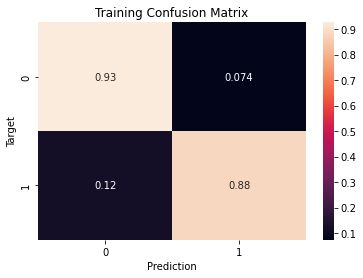

In [180]:
train_preds = predict_and_plot(X_train, train_targets, 'Training')

Accuracy: 89.91%


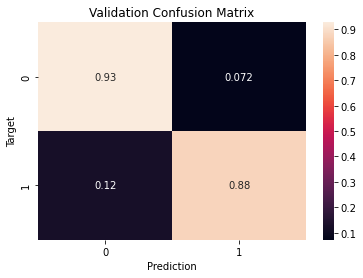

In [181]:
val_preds = predict_and_plot(X_val, val_targets, 'Validation')

Accuracy: 89.82%


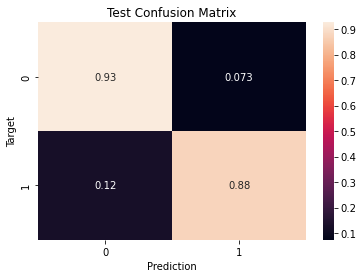

In [182]:
test_preds = predict_and_plot(X_test, test_targets, 'Test')